In [12]:
import pandas as pd
import geopandas as gpd
import numpy as np
import os 
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import requests
import shutil

In [13]:
directorio = os.path.dirname(os.getcwd())

In [14]:
baches = gpd.read_file(directorio + '/data/processed/tidy_baches_agebs_hmo.shp')
baches.CVEGEO = baches.CVEGEO.str[-4:]
se_ageb = gpd.read_file(directorio + '/data/processed/tidy_socioeconimico_ageb_hermosillo.shp')
se = pd.read_csv(directorio + '/data/processed/tidy_socioeconomico_hermosillo.csv')

In [15]:
baches = baches.dropna()

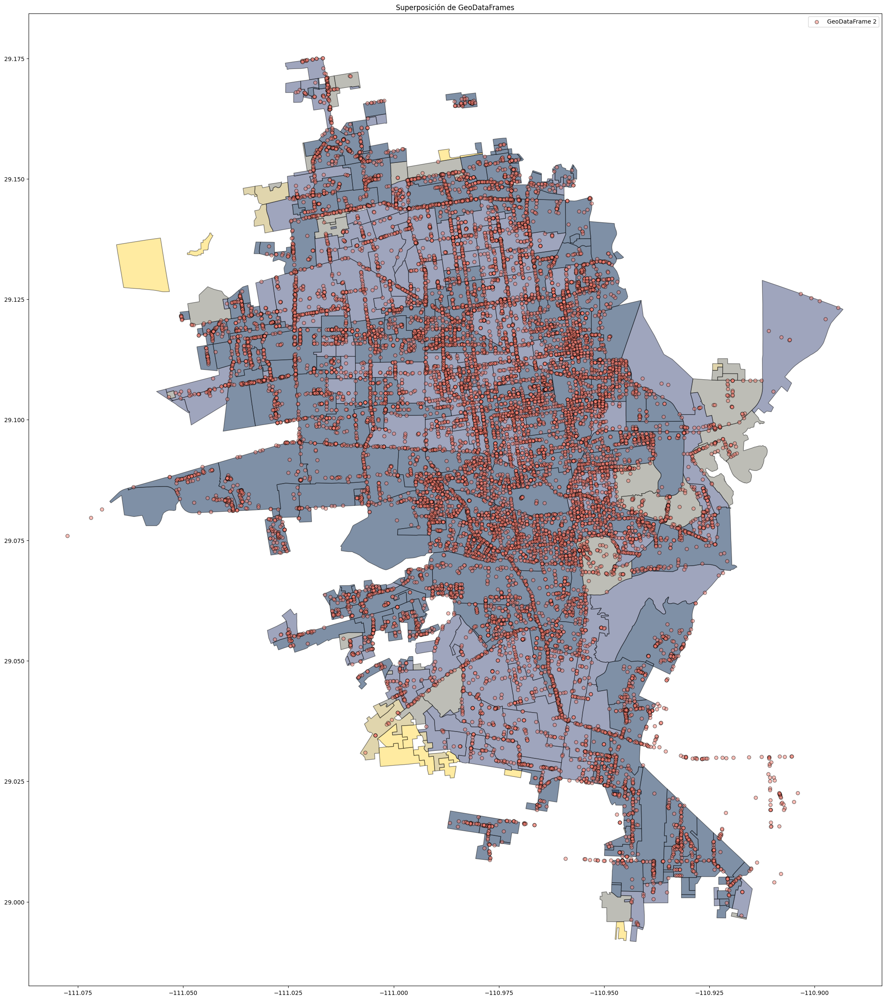

In [16]:
fig, ax = plt.subplots(figsize=(30,30))
se_ageb[se_ageb.GM_2020 == 'Muy alto'].plot(ax=ax, color="#FFD945", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Alto'].plot(ax=ax, color="#C2AC5C", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Medio'].plot(ax=ax, color="#7D7D6E", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Bajo'].plot(ax=ax, color="#414C7D", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Muy bajo'].plot(ax=ax, color="#00224E", edgecolor="black", alpha=0.5)

baches.plot(ax=ax, color="salmon", edgecolor="black", alpha=0.5, label="GeoDataFrame 2")

# Agregar leyenda y título
plt.legend()
plt.title("Superposición de GeoDataFrames")
plt.show()

In [ ]:
#Descargando el archivo zip de las agebs
url = 'https://www.inegi.org.mx/contenidos/productos/prod_serv/contenidos/espanol/bvinegi/productos/geografia/urbana/SHP_2/Sonora/702825317744_s.zip'

if not os.path.exists(directorio + '/data/raw/agebs_hmo.zip'):
    if not os.path.exists(directorio + '/data/raw'):
        if not os.path.exists(directorio + '/data'):
            os.makedirs(directorio + '/data')
        os.makedirs(directorio + '/data/raw')
    r = requests.get(url, allow_redirects=True) 
    open(directorio + '/data/raw/agebs_hmo.zip', 'wb').write(r.content)

"#Descargando el archivo zip de las agebs\nurl = 'https://www.inegi.org.mx/contenidos/productos/prod_serv/contenidos/espanol/bvinegi/productos/geografia/urbana/SHP_2/Sonora/702825317744_s.zip'\n\nif not os.path.exists(directorio + '/data/raw/agebs_hmo.zip'):\n    if not os.path.exists(directorio + '/data/raw'):\n        if not os.path.exists(directorio + '/data'):\n            os.makedirs(directorio + '/data')\n        os.makedirs(directorio + '/data/raw')\n    r = requests.get(url, allow_redirects=True) \n    open(directorio + '/data/raw/agebs_hmo.zip', 'wb').write(r.content)"

In [ ]:
# Descomprimir agebs_hmo.zip y eliminar archivos inecesarios
datos = '/data/raw/agebs_hmo'
archivo_ageb = '/data/raw/agebs_hmo.zip'
hmo_ageb = ['.html', 'v.dbf','v.prj','v.shp', 'v.shp.xml', 'v.dbf', 'v.shx']

if not os.path.exists(directorio + datos):
    with zipfile.ZipFile(directorio + archivo_ageb, 'r') as zip_ref:
        zip_ref.extractall(path= directorio + datos)

with zipfile.ZipFile(directorio + datos + '/260300001.zip') as zip_ref:
    for archivo in hmo_ageb:
        if not os.path.exists(directorio + datos + '260300001' + archivo):
            zip_ref.extract('260300001' + archivo, directorio + '/data/raw')


shutil.rmtree(directorio + datos)
os.remove(directorio +'/data/raw/agebs_hmo.zip')

"# Descomprimir agebs_hmo.zip y eliminar archivos inecesarios\ndatos = '/data/raw/agebs_hmo'\narchivo_ageb = '/data/raw/agebs_hmo.zip'\nhmo_ageb = ['.html', 'v.dbf','v.prj','v.shp', 'v.shp.xml', 'v.dbf', 'v.shx']\n\nif not os.path.exists(directorio + datos):\n    with zipfile.ZipFile(directorio + archivo_ageb, 'r') as zip_ref:\n        zip_ref.extractall(path= directorio + datos)\n\nwith zipfile.ZipFile(directorio + datos + '/260300001.zip') as zip_ref:\n    for archivo in hmo_ageb:\n        if not os.path.exists(directorio + datos + '260300001' + archivo):\n            zip_ref.extract('260300001' + archivo, directorio + '/data/raw')\n\n\nshutil.rmtree(directorio + datos)\nos.remove(directorio +'/data/raw/agebs_hmo.zip')"

In [19]:
hmo_via =  gpd.read_file(directorio + '/data/raw/260300001v.shp')
hmo_via= hmo_via.to_crs("EPSG:4326")

<Axes: >

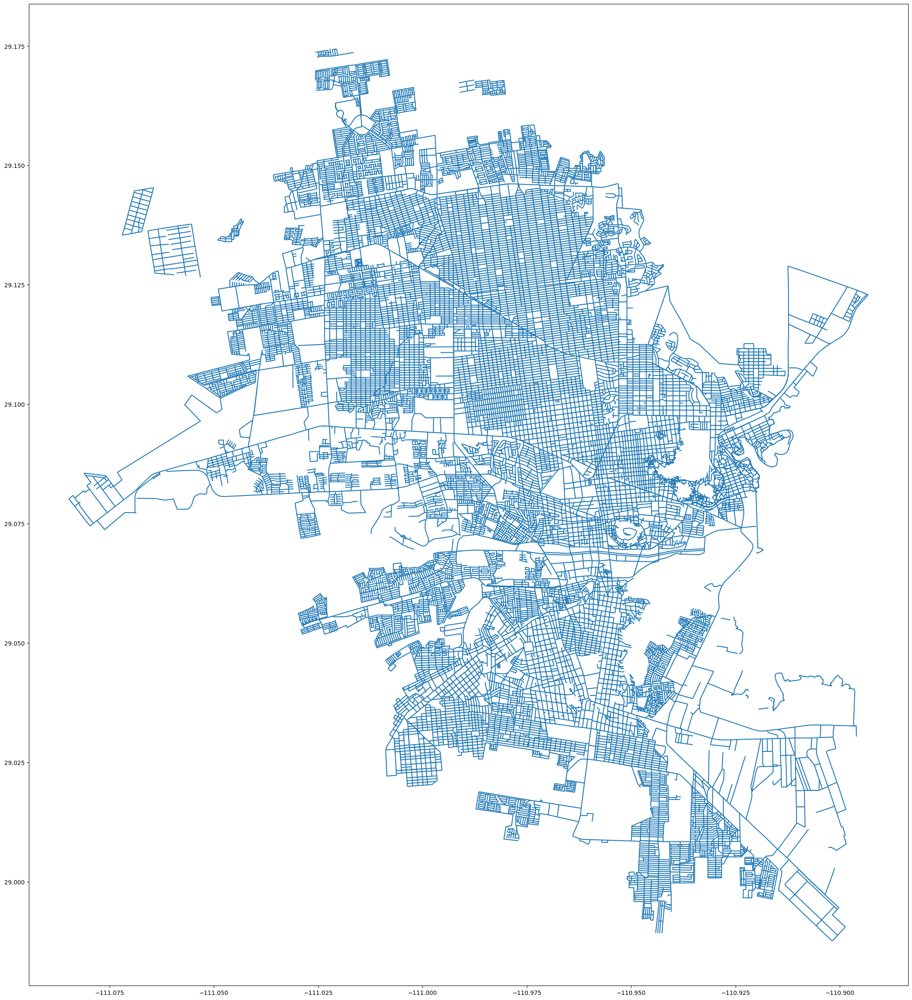

In [20]:
hmo_via.plot(figsize=(30,30))

/tmp/ipykernel_111702/896508431.py:6: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


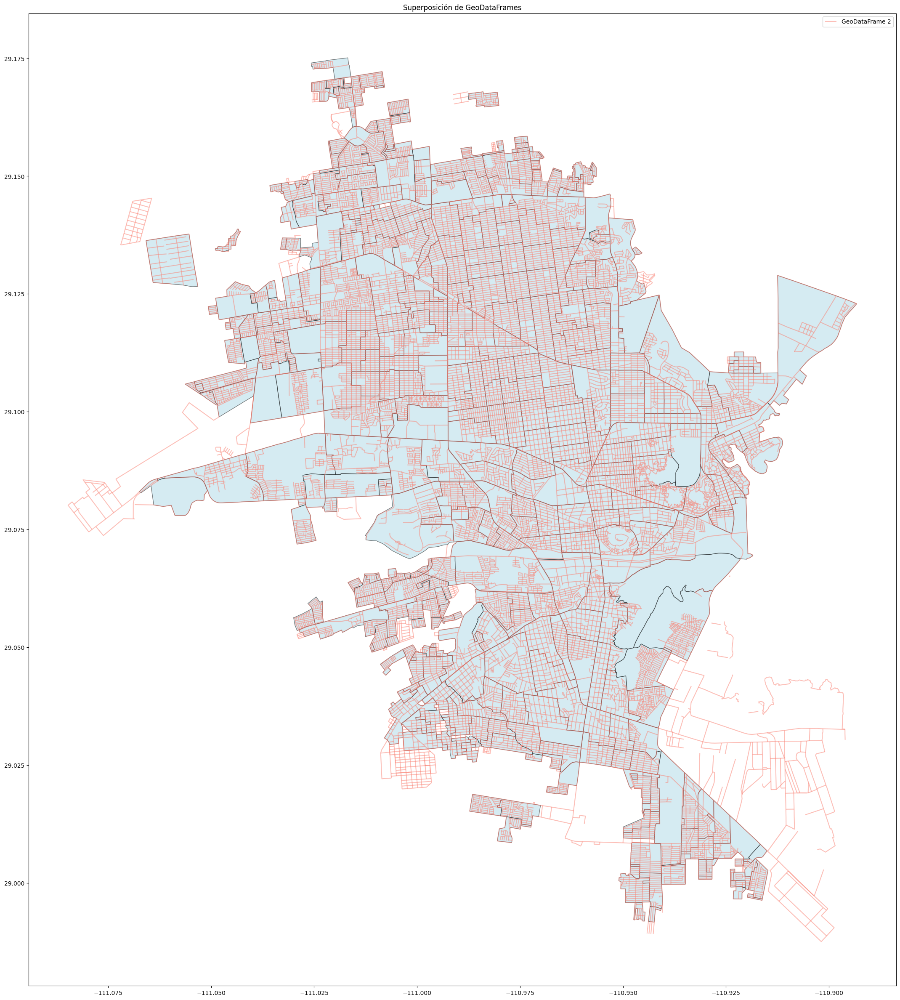

In [21]:
fig, ax = plt.subplots(figsize=(30,30))
se_ageb.plot(ax=ax, color="lightblue", edgecolor="black", alpha=0.5, label="GeoDataFrame 1")
hmo_via.plot(ax=ax, color="salmon", edgecolor="black", alpha=0.5, label="GeoDataFrame 2")

# Agregar leyenda y título
plt.legend()
plt.title("Superposición de GeoDataFrames")
plt.show()

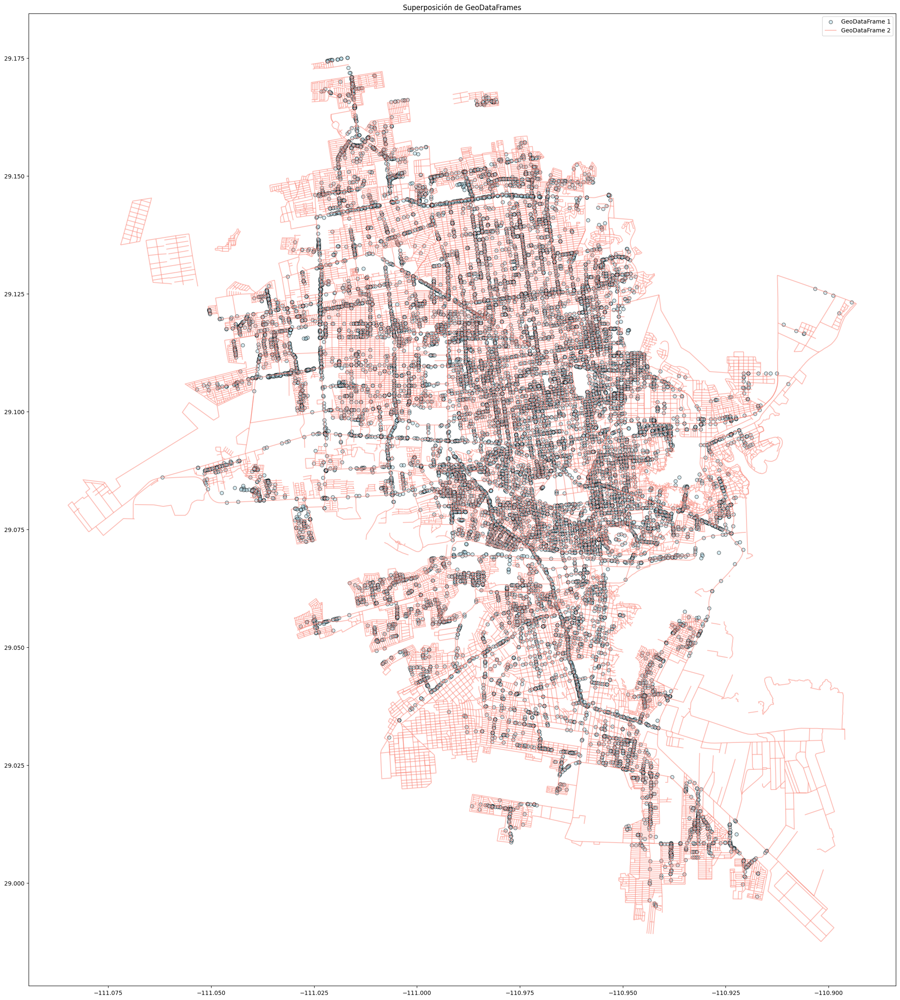

In [22]:
fig, ax = plt.subplots(figsize=(30,30))
baches[baches['CVEGEO'].isin(se_ageb.CVEGEO.to_list())].plot(ax=ax, color="lightblue", edgecolor="black", alpha=0.5, label="GeoDataFrame 1")
hmo_via.plot(ax=ax, color="salmon", edgecolor="black", alpha=0.5, label="GeoDataFrame 2")

# Agregar leyenda y título
plt.legend()
plt.title("Superposición de GeoDataFrames")
plt.show()

In [23]:
hmo_via = hmo_via.to_crs('EPSG:32612')
baches = baches.to_crs('EPSG:32612')
vialidades_buffer = hmo_via.copy()
vialidades_buffer = vialidades_buffer.to_crs("EPSG:32612")


vialidades_buffer["geometry"] = hmo_via.buffer(8)  


puntos_en_vialidades = gpd.sjoin(baches, vialidades_buffer, predicate="within")

In [24]:
puntos = puntos_en_vialidades.groupby(['NOMVIAL','geometry'],as_index=False).size().sort_values(by="size", ascending=False)
puntos.head(15)

,NOMVIAL,geometry,size
11193,MANUEL Z. CUBILLAS,POINT (504290.448 3216070.614),36
16168,ROSALES,POINT (504290.448 3216070.614),36
14326,PINO SUÁREZ,POINT (504290.448 3216070.614),36
6876,GENERAL JOSÉ MARÍA YÁÑEZ,POINT (504267.697 3216836.999),30
5005,DOCTOR ALBERTO NORIEGA,POINT (504267.697 3216836.999),30
6877,GENERAL JOSÉ MARÍA YÁÑEZ,POINT (504267.697 3216838.038),18
5006,DOCTOR ALBERTO NORIEGA,POINT (504267.697 3216838.038),18
10455,LUZ VALENCIA,POINT (498135.055 3224223.183),15
8218,ISRAEL GONZÁLEZ Y/O PERIMETRAL,POINT (504217.897 3218693.286),15
14177,PERIMETRAL NORTE,POINT (500034.073 3220158.404),14


In [25]:
baches_por_calle = puntos.groupby('NOMVIAL',as_index=False)['size'].sum().sort_values(by='size', ascending=False)

<Axes: >

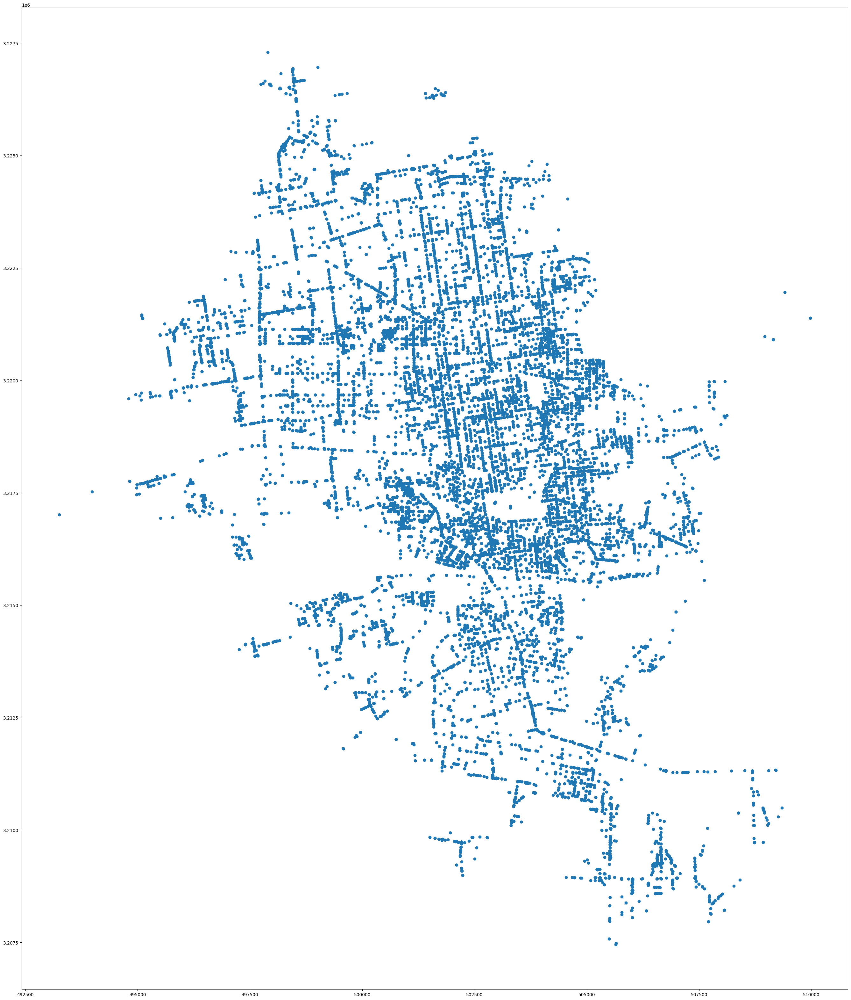

In [26]:
puntos_en_vialidades.plot(figsize=(40,40))

In [27]:
calles_baches = puntos_en_vialidades.groupby(['NOMVIAL','geometry'],as_index=False).size().sort_values(by="size", ascending=False)
calles_baches = calles_baches.groupby('NOMVIAL', as_index=False)['size'].sum()

In [28]:
calles_baches = calles_baches.sort_values(by="size",ascending=False)[calles_baches.NOMVIAL != "NINGUNO"] \
                                                    ['NOMVIAL'].head(20).to_list()

/tmp/ipykernel_111702/1262059468.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  calles_baches = calles_baches.sort_values(by="size",ascending=False)[calles_baches.NOMVIAL != "NINGUNO"] \


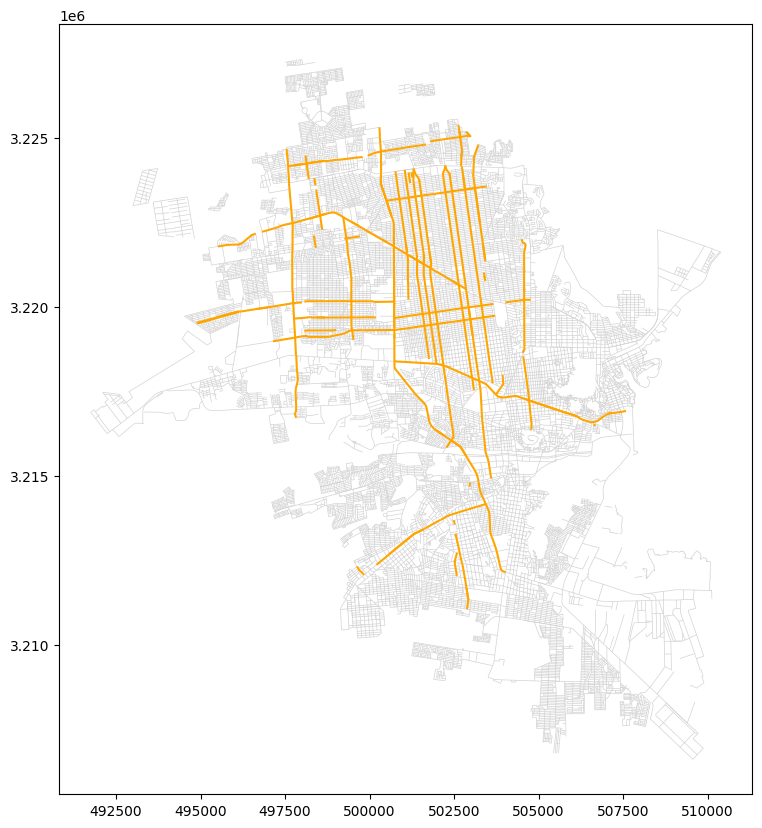

In [29]:
hmo_via['es_destacada'] = hmo_via['NOMVIAL'].isin(calles_baches)

# Graficar
fig, ax = plt.subplots(figsize=(10, 10))
hmo_via[~hmo_via['es_destacada']].plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.5)  # Colonias no destacadas
hmo_via[hmo_via['es_destacada']].plot(ax=ax, color='orange', edgecolor='red', linewidth=1.5)        # Colonias destacadas

plt.show()
hmo_via = hmo_via.drop(columns=['es_destacada'])

In [30]:
hmo_via['longitud'] = hmo_via.geometry.length
hey = hmo_via.groupby('NOMVIAL',as_index=False)['longitud'].sum().sort_values(by='longitud',ascending=False)
hey = hey[hey.NOMVIAL != 'NINGUNO']
hey = hey.reset_index(drop=True)
hey.head()

,NOMVIAL,longitud
0,SOLIDARIDAD,18217.934562
1,LÁZARO CÁRDENAS DEL RÍO,14696.308063
2,LUIS DONALDO COLOSIO MURRIETA,12142.825354
3,DE LA REFORMA,10467.482232
4,CAMINO DEL SERI,10140.943976


In [31]:
baches_por_calle = baches_por_calle.merge(hey, on='NOMVIAL')
baches_por_calle.head()

,NOMVIAL,size,longitud
0,DE LA REFORMA,374,10467.482232
1,SOLIDARIDAD,321,18217.934562
2,DOCTOR DOMINGO OLIVARES,285,8977.171615
3,GENERAL MIGUEL PIÑA,227,8414.802134
4,LÓPEZ DEL CASTILLO,223,6335.441006


In [32]:
baches_por_calle['baches_por_metro'] = baches_por_calle['size'] / baches_por_calle['longitud']
baches_por_calle.head()
baches_por_calle.sort_values(by='baches_por_metro').head(10)

,NOMVIAL,size,longitud,baches_por_metro
1966,JUAN ROMERO,1,2114.339798,0.000473
1790,CHETUMAL,1,2056.458278,0.000486
1488,DE LOS SERIS,2,3819.555842,0.000524
2129,CUARTA,1,1719.328943,0.000582
1735,QUIRIEGO,1,1650.220592,0.000606
1697,DEL ORO,1,1586.266258,0.000630
1830,LEANDRO VALENCIA URÍAS,1,1573.148101,0.000636
1751,GLADIOLA,1,1517.222881,0.000659
2151,VERGEL,1,1438.253677,0.000695
2119,URES,1,1384.745524,0.000722
